### Importar Bibliotecas

In [1]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

### Importar e Consolidar Base de Dados

In [2]:
meses = {'jan':1, 'fev':2, 'mar':3, 'abr':4, 'mai':5, 'jun':6, 'jul':7, 'ago':8, 'set':9, 'out':10, 'nov':11, 'dez':12}

caminho_bases = pathlib.Path('dataset')

base_airbnb = pd.DataFrame()

for arquivo in caminho_bases.iterdir():
    nome_mes = arquivo.name[:3]
    mes = meses[nome_mes]
    
    ano = arquivo.name[-8:]
    ano = int(ano.replace('.csv',''))
    
    df = pd.read_csv(caminho_bases / arquivo.name)
    df['ano'] = ano
    df['mês'] = mes
    base_airbnb = pd.concat([base_airbnb, df])
    
display(base_airbnb)

C:\Users\Hugo\AppData\Local\Temp\ipykernel_9788\3905898757.py:14: DtypeWarning: Columns (62,87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\Hugo\AppData\Local\Temp\ipykernel_9788\3905898757.py:14: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\Hugo\AppData\Local\Temp\ipykernel_9788\3905898757.py:14: DtypeWarning: Columns (61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\Hugo\AppData\Local\Temp\ipykernel_9788\3905898757.py:14: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(caminho_bases / arquivo.name)
C:\Users\Hugo\AppData\Local\Temp\ipykernel_9788\3905898757.py:14: DtypeWarning: Columns (61,62,94) have mixed types. Spec

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
34325,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
34326,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
34327,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Se tivermos muitas colunas, já vamos identificar quais colunas podemos excluir

- Como temos muitas colunas, nosso modelo pode acabar ficando muito lento
- Além disso, uma análise rápida permite ver que várias colunas não são necessárias para o modelo de previsão, por isso, vamos excluir algumas colunas da nossa base
- Tipos de colunas que vamos excluir:
    1. IDs, Links e informações não relevantes para o modelo
    2. Colunas repetidas ou redundantes (que dão a mesma informação para o modelo. Ex: Data x Ano/Mês)
    3. Colunas preenchidas com texto livre -> Não vamos rodar nenhuma análise de texto
    4. Colunas em que todos/quase todos os valores são iguais
    
- Para isso, vamos criar um arquivo em excel com os 1000 primeiros registros e fazer uma análise qualitativa

In [43]:
print(list(base_airbnb.columns))
base_airbnb.head(1000).to_csv('primeiros_registros.csv', sep=';')

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

### Depois da análise qualitativa das colunas, levando em conta os critérios explicados acima, ficamos com as seguintes colunas:

In [3]:
primeiros_valores = pd.read_csv('primeiros_registros.csv', sep=';')
print(primeiros_valores.columns)

Index(['host_response_time', 'host_response_rate', 'host_is_superhost',
       'host_listings_count', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'price', 'security_deposit', 'cleaning_fee',
       'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights',
       'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'is_business_travel_ready',
       'cancellation_policy', 'ano', 'mês'],
      dtype='object')


In [4]:
#Filtrando a base original com base nessas colunas que consideramos relevantes
colunas = list(primeiros_valores.columns)

base_airbnb = base_airbnb.loc[:, colunas]
display(base_airbnb)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,ano,mês
0,NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34324,within an hour,93%,f,0.0,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34325,NaN,NaN,f,0.0,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
34326,within a few hours,74%,f,32.0,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
34327,NaN,NaN,f,0.0,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


### Tratar Valores Faltando

- Visualizando os dados percebemos que existe uma grande disparidade em dados faltantes. As colunas com mais de 300.000 valores NaN foram excluídas da análise;
- Para as outras colunas, como temos muitos dados (mais de 900.000) vamos excluir as linhas que contém dados NaN

In [5]:
print(base_airbnb.isnull().sum())

host_response_time             401843
host_response_rate             401846
host_is_superhost                 460
host_listings_count               460
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bathrooms                        1724
bedrooms                          850
beds                             2502
bed_type                            0
amenities                           0
price                               0
security_deposit               421280
cleaning_fee                   313506
guests_included                     0
extra_people                        0
minimum_nights                      0
maximum_nights                      0
number_of_reviews                   0
review_scores_rating           448016
review_scores_accuracy         448586
review_scores_cleanliness      448413
review_scores_checkin          448650
review_score

In [6]:
for coluna in base_airbnb:
    if base_airbnb[coluna].isnull().sum() > 300000:
        base_airbnb = base_airbnb.drop(coluna, axis=1)
    
print(base_airbnb.isnull().sum())

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
ano                            0
mês                            0
dtype: int64


In [7]:
#verificando novamente quantas linhas e colunas sobraram após esse tratamento
print(base_airbnb.shape)

(902210, 23)


In [8]:
#as linhas vazias que estão em [host_is_superhost, host_listings_count, bathrooms, bedrooms, beds]
base_airbnb = base_airbnb.dropna()
print(base_airbnb.shape)

(897709, 23)


In [9]:
#agora não temos nenhuma linha vazia
print(base_airbnb.isnull().sum())

host_is_superhost           0
host_listings_count         0
latitude                    0
longitude                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                   0
bedrooms                    0
beds                        0
bed_type                    0
amenities                   0
price                       0
guests_included             0
extra_people                0
minimum_nights              0
maximum_nights              0
number_of_reviews           0
instant_bookable            0
is_business_travel_ready    0
cancellation_policy         0
ano                         0
mês                         0
dtype: int64


### Verificar Tipos de Dados em cada coluna

In [10]:
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mês                           int64
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count

- Como price e extra_people estão sendo reconhecidos como objeto (ao invés de float) temos que mudar o tipo de variável da coluna.

In [11]:
#price
base_airbnb['price'] = base_airbnb['price'].str.replace('$','').str.replace(',','')
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

#extra_people
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$','').str.replace(',','')
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)

#verificando os tipos
print(base_airbnb.dtypes)

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
ano                           int64
mês                           int64
dtype: object


### Análise Exploratória e Tratar Outliers

- Vamos basicamente olhar feature por feature para:
    1. Ver a correlação entre as features e decidir se manteremos todas as features que temos.
    2. Excluir outliers (usaremos como regra, valores abaixo de Q1 - 1.5xAmplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1
    3. Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir
    
- Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos.

- Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

- Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

MAS CUIDADO: não saia excluindo direto outliers, pense exatamente no que você está fazendo. Se não tem um motivo claro para remover o outlier, talvez não seja necessário e pode ser prejudicial para a generalização. Então tem que ter uma balança ai. Claro que você sempre pode testar e ver qual dá o melhor resultado, mas fazer isso para todas as features vai dar muito trabalho.

Ex de análise: Se o objetivo é ajudar a precificar um imóvel que você está querendo disponibilizar, excluir outliers em host_listings_count pode fazer sentido. Agora, se você é uma empresa com uma série de propriedades e quer comparar com outras empresas do tipo também e se posicionar dessa forma, talvez excluir quem tem acima de 6 propriedades tire isso do seu modelo. Pense sempre no seu objetivo

<Axes: >

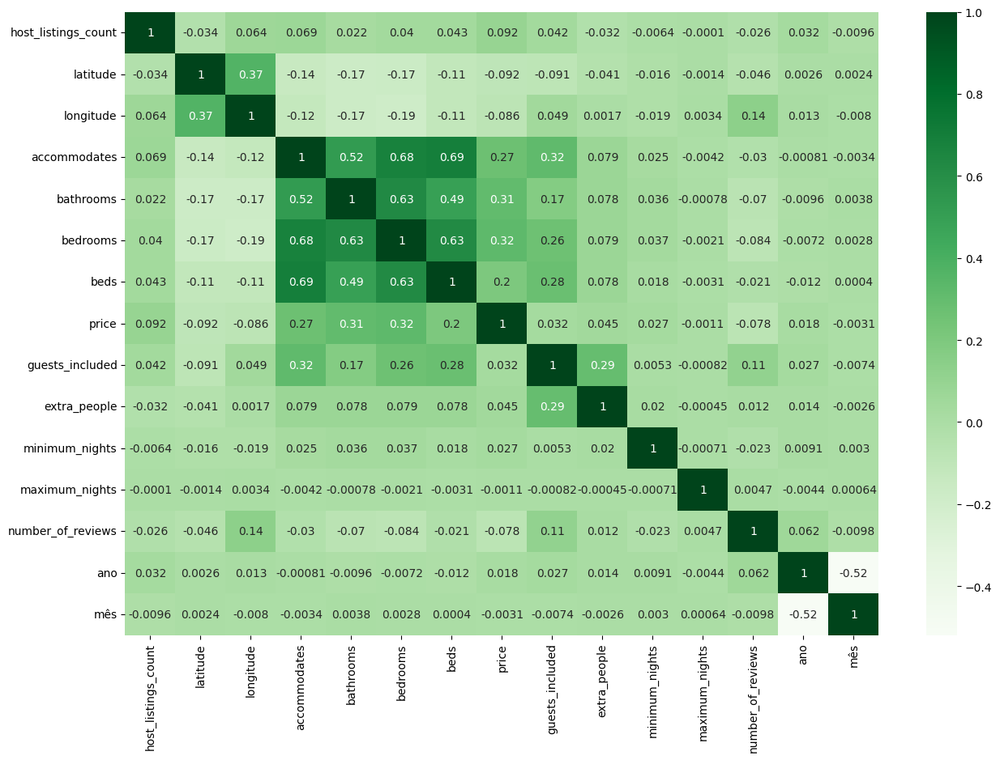

In [12]:
plt.figure(figsize=(15,10))
sns.heatmap(base_airbnb.corr(numeric_only=True), annot=True, cmap='Greens')

#### obs: se existe uma correlação muito forte entre as features, as vezes vale a pena eleminar uma delas pois corremos o risco de overfitting

### Definição de funções para análise de outliers

Vamos algumas funções para ajudar na análise de outliers das colunas(features)

In [13]:
def limites(coluna):
    q1 = coluna.quantile(0.25)
    q3 = coluna.quantile(0.75)
    amplitude = q3 - q1
    return q1-1.5*amplitude, q3+1.5*amplitude

def excluir_outlier(df, nome_coluna):
    qtd_linhas = df.shape[0]
    lim_inf, lim_sup = limites(df[nome_coluna])
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]
    qtd_linhas_removidas = qtd_linhas - df.shape[0]
    return df, qtd_linhas_removidas

In [14]:
def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 5)
    sns.boxplot(x=coluna, ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)
    
def histograma(coluna):
    plt.figure(figsize=(15,5))
    sns.histplot(data = base_airbnb, x=coluna, element='bars')
    
def grafico_barra(coluna):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))
    
def grafico_contagem(coluna, base):
    plt.figure(figsize=(15, 5))
    grafico = sns.countplot(x = coluna, data = base)
    grafico.tick_params(axis='x', rotation=90)

### Analisando 'price'

- Considerando que o objetivo é criar um modelo para imóveis comuns (e não imóveis de luxo ou uma imobiliária), vamos excluir os outliers que estão acima do limite superior pois estão fora da nossa realidade.


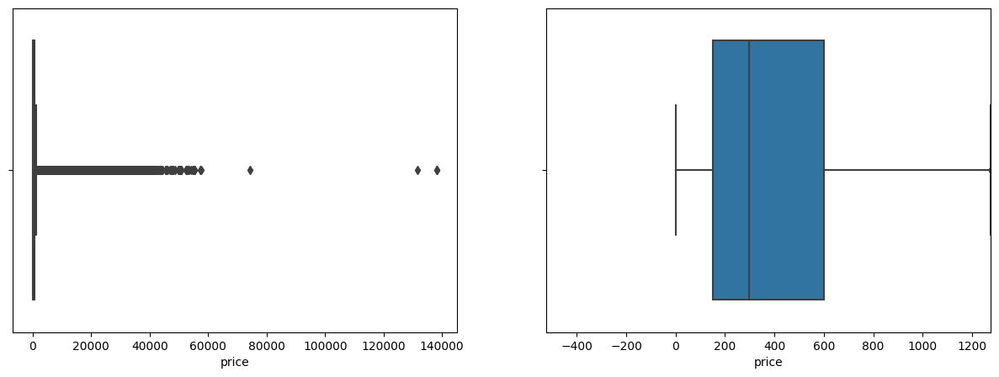

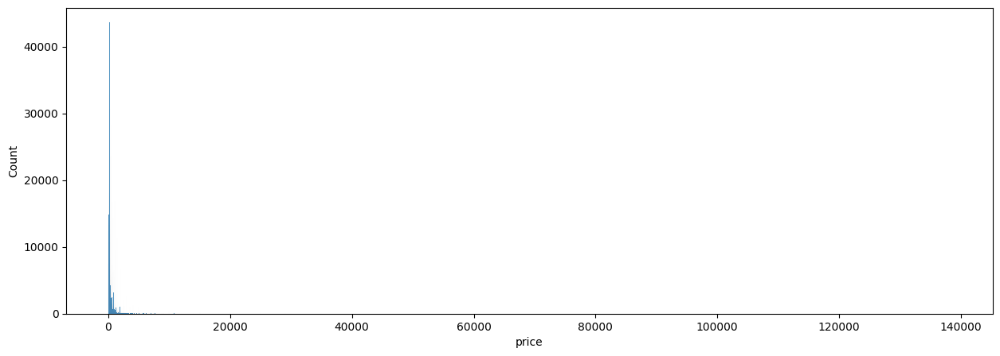

In [15]:
diagrama_caixa(base_airbnb['price'])
histograma(base_airbnb['price'])

In [16]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'price')
print(f'{linhas_removidas} linhas removidas.')

87282 linhas removidas.


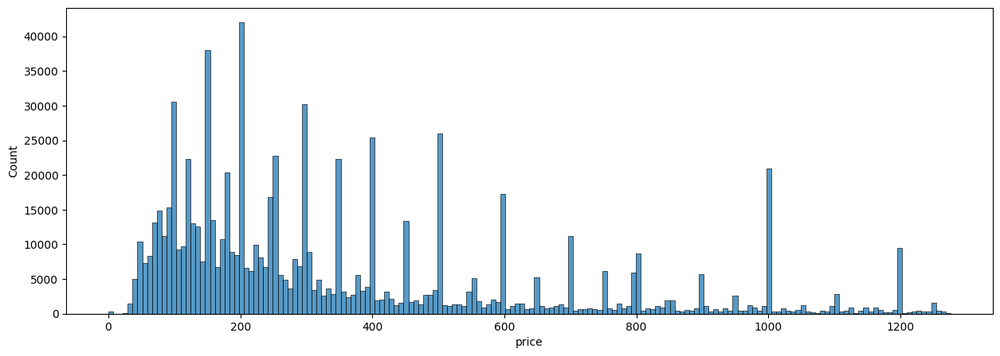

In [17]:
#agora com os outliers removidos
histograma(base_airbnb['price'])

### Analisando 'extra_people'

- Aqui vamos excluir os outliers, pois eles também estão fora da realidade do nosso público alvo

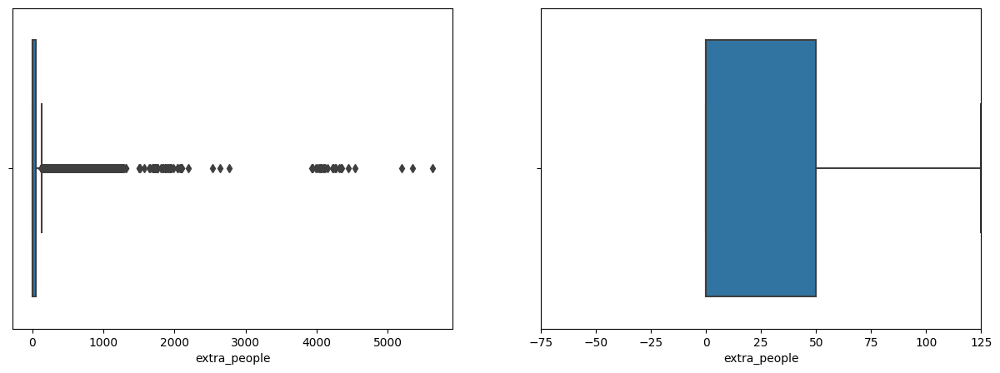

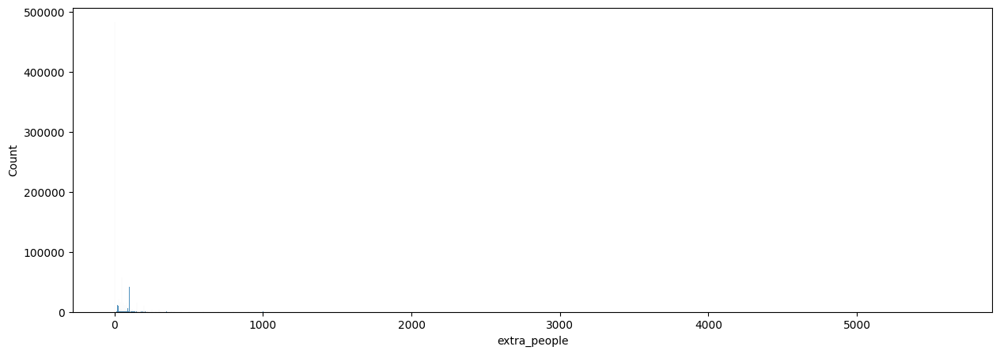

In [18]:
diagrama_caixa(base_airbnb['extra_people'])
histograma(base_airbnb['extra_people'])

In [19]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'extra_people')
print(f'{linhas_removidas} linhas removidas.')

59194 linhas removidas.


(751233, 23)


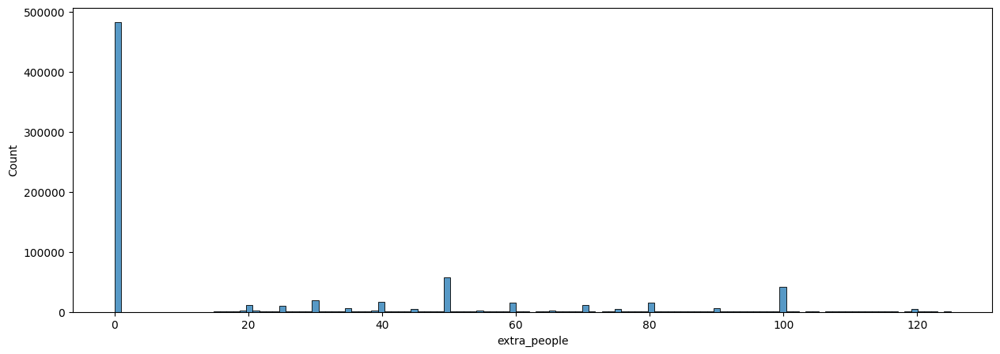

In [20]:
#agora com os outliers removidos
histograma(base_airbnb['extra_people'])
print(base_airbnb.shape)

### Analisando 'host_listings_count'

- Podemos excluir os outliers, porque para o objetivo do nosso projeto porque hosts com mais de 6 imóveis no airbnb não é o público alvo do objetivo do projeto (imagino que sejam imobiliários ou profissionais que gerenciam imóveis no airbnb)

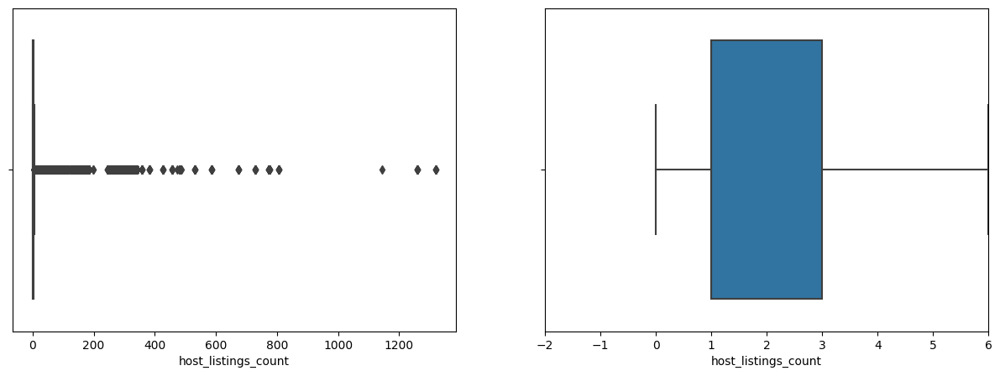

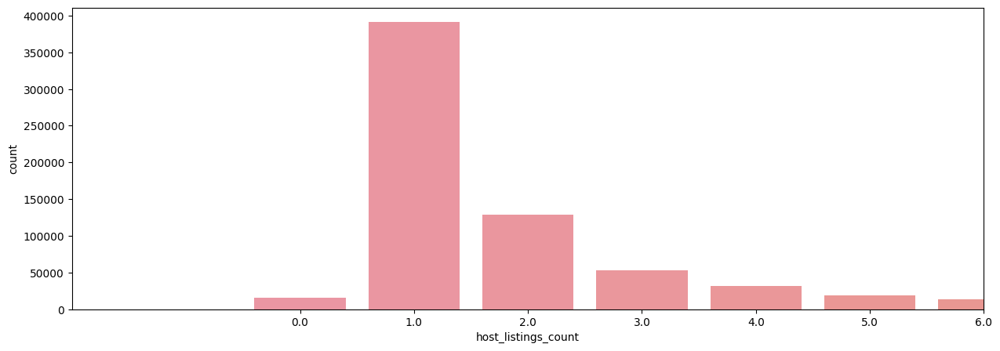

In [21]:
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

In [22]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'host_listings_count')
print(f'{linhas_removidas} linhas removidas.')

97723 linhas removidas.


In [23]:
#checando os limites inferiores e superiores
print(limites(base_airbnb['host_listings_count']))

(-0.5, 3.5)


(653510, 23)


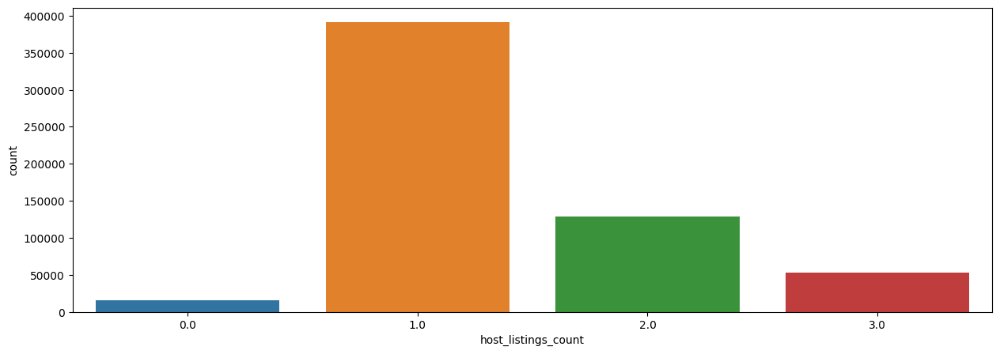

In [24]:
#agora com os outliers removidos
grafico_barra(base_airbnb['host_listings_count'])
print(base_airbnb.shape)

### Analisando 'accommodates'

- Considerando que imóveis acima do limite superior são casas do tipo de luxo (ex: mansões), vamos excluir esses outliers pois estão fora da realidade desejada

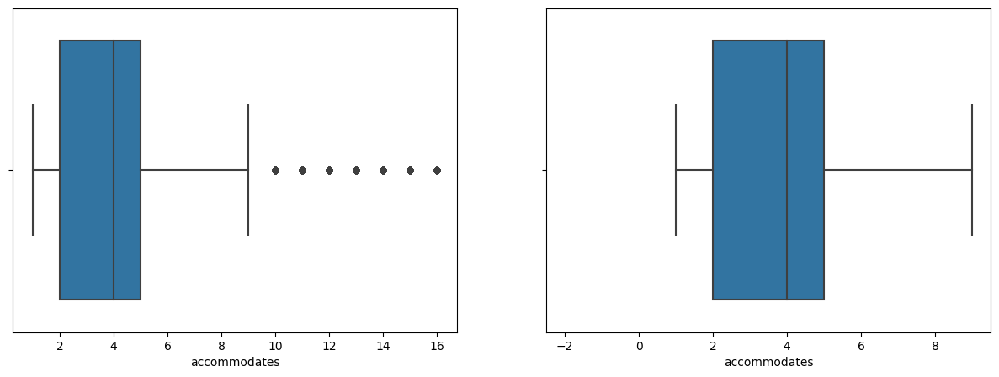

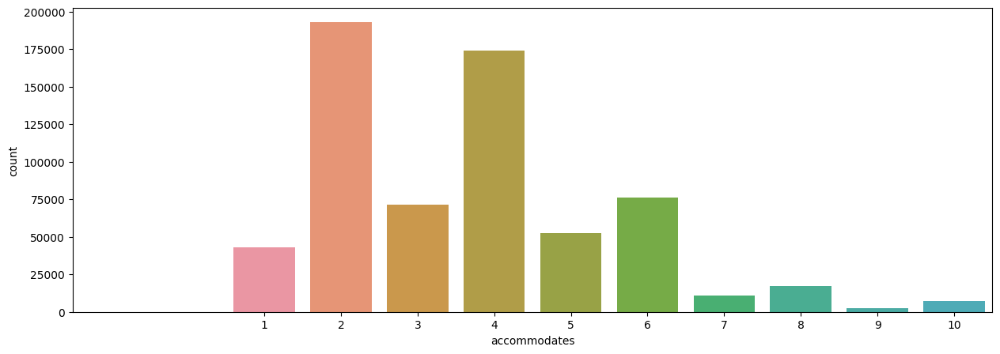

In [25]:
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

In [26]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'accommodates')
print(f'{linhas_removidas} linhas removidas.')

13146 linhas removidas.


In [27]:
#checando os limites inferiores e superiores
print(limites(base_airbnb['accommodates']))

(-1.0, 7.0)


(640364, 23)


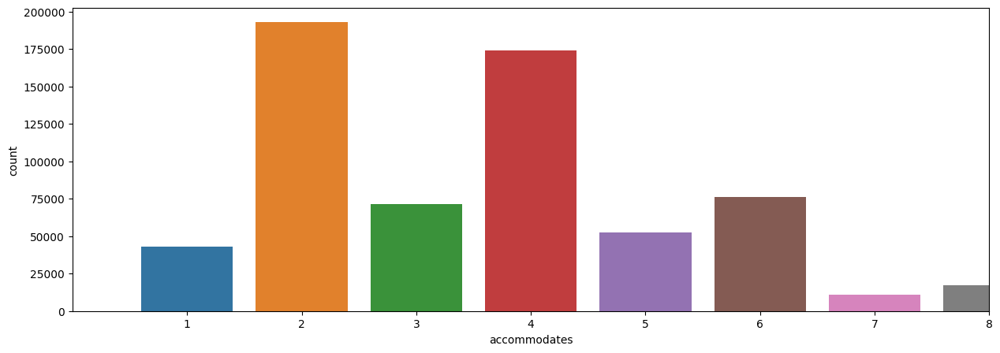

In [28]:
#agora com os outliers removidos
grafico_barra(base_airbnb['accommodates'])
print(base_airbnb.shape)

### Analisando 'bathrooms'

- Aqui vamos excluir os outliers, pois eles também estão fora da realidade do nosso público alvo

<Axes: xlabel='bathrooms', ylabel='count'>

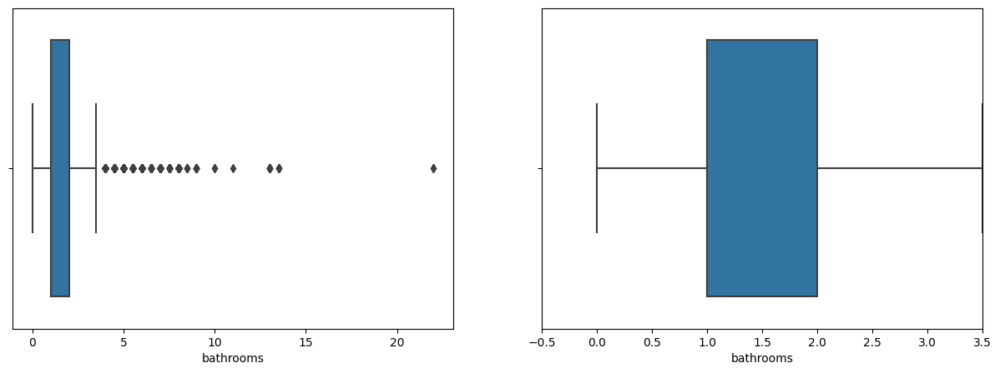

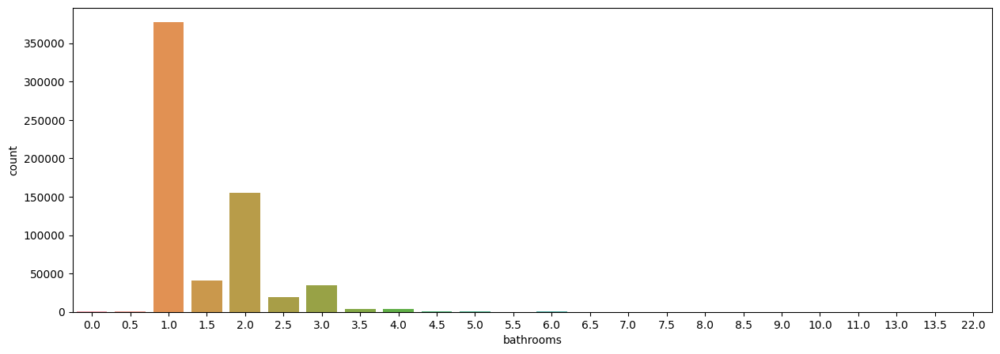

In [29]:
diagrama_caixa(base_airbnb['bathrooms'])

plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())

In [30]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'bathrooms')
print(f'{linhas_removidas} linhas removidas.')

6894 linhas removidas.


(633470, 23)


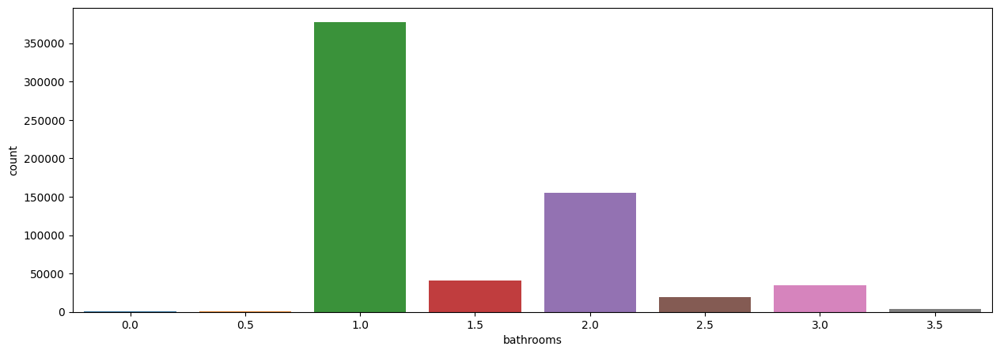

In [31]:
#agora com os outliers removidos
plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())
print(base_airbnb.shape)

### Analisando 'bedrooms'

- Aqui vamos excluir os outliers, pois eles também estão fora da realidade do nosso público alvo

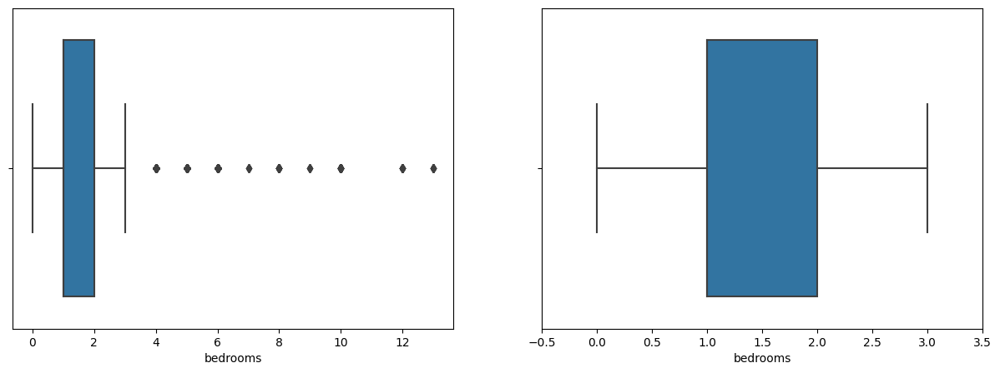

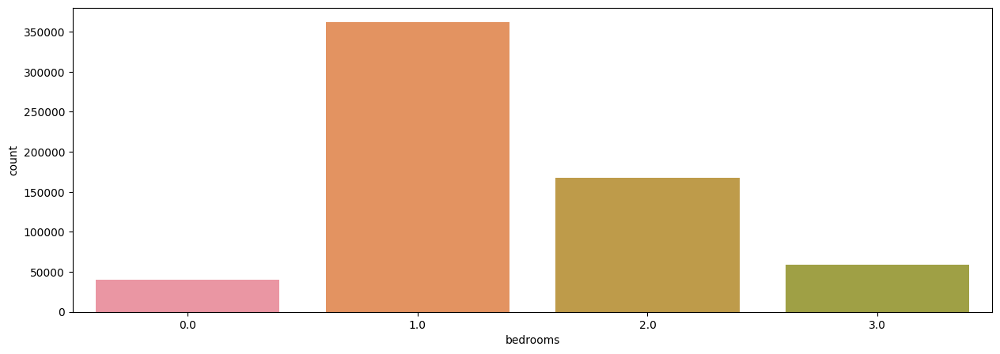

In [32]:
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

In [33]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'bedrooms')
print(f'{linhas_removidas} linhas removidas.')

5482 linhas removidas.


(627988, 23)


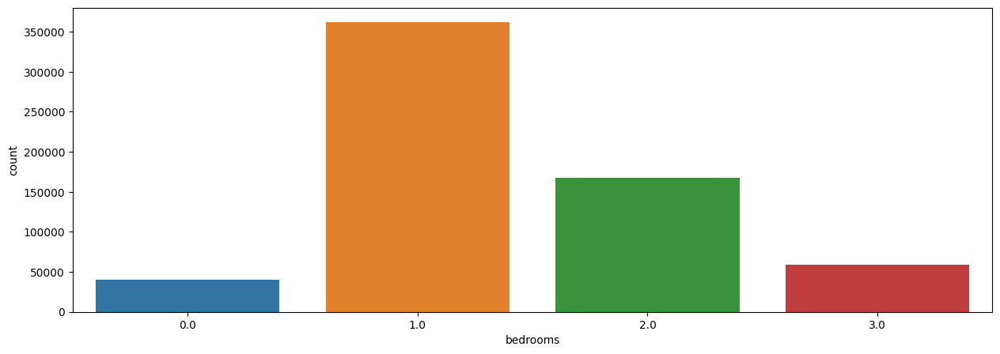

In [34]:
#agora com os outliers removidos
grafico_barra(base_airbnb['bedrooms'])
print(base_airbnb.shape)

### Analisando 'beds'

- Aqui vamos excluir os outliers, pois eles também estão fora da realidade do nosso público alvo

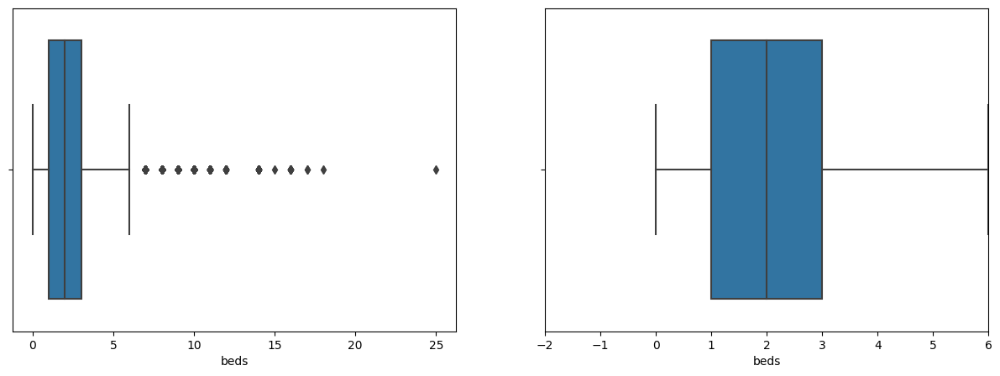

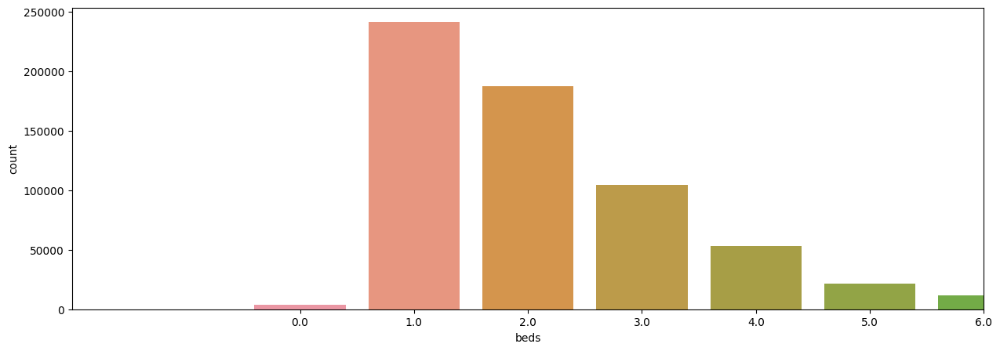

In [35]:
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

In [36]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'beds')
print(f'{linhas_removidas} linhas removidas.')

5622 linhas removidas.


(622366, 23)


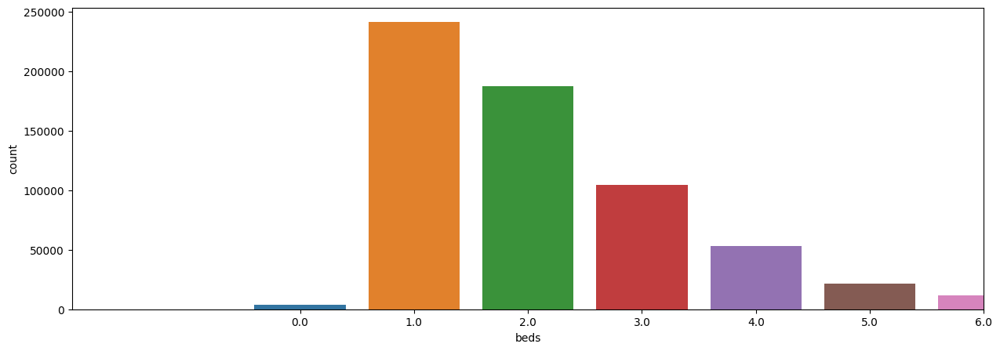

In [37]:
#agora com os outliers removidos
grafico_barra(base_airbnb['beds'])
print(base_airbnb.shape)

### Analisando 'guests_included'

- Vamos remover esta 'feature' da análise, parecem que os hosts da airbnb usam muito o valor padrão do airbnb que é 1 na coluna de 'guests_included'. Isso pode levar ao modelo a considerar uma 'feature' que na verdade não é essencial para a definição do preço, por isso me parece melhor excluir esta coluna da análise.

<Axes: xlabel='guests_included', ylabel='count'>

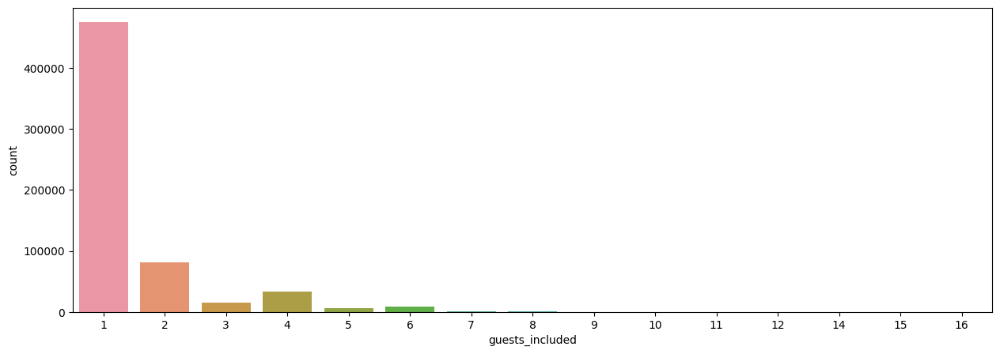

In [38]:
# diagrama_caixa(base_airbnb['guests_included'])
# grafico_barra(base_airbnb['guests_included'])

plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['guests_included'].value_counts().index, y=base_airbnb['guests_included'].value_counts())

In [39]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

### Analisando 'minimum_nights'

- Aluguéis que necessitam um mínimo de noite maior geralmente são locais que são alugados para temporada de férias, por isso podemos excluir esses outliers, pois está fora do nosso contexto

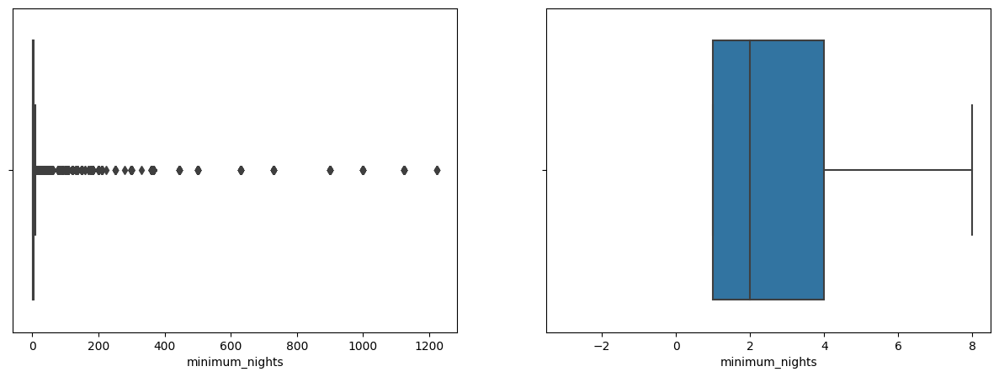

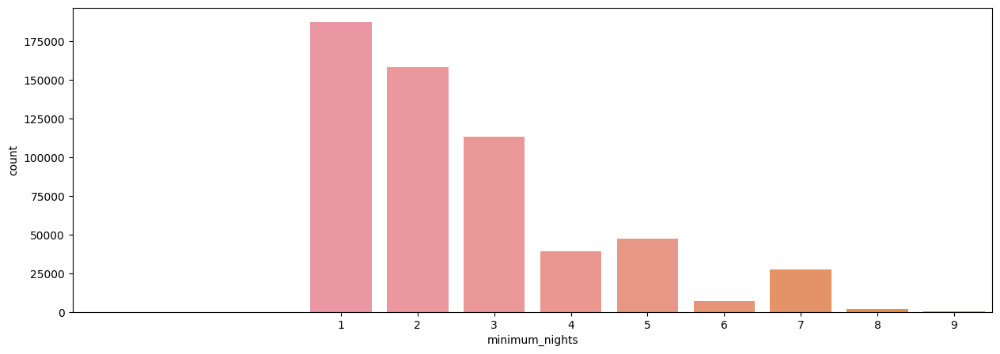

In [40]:
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

In [41]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'minimum_nights')
print(f'{linhas_removidas} linhas removidas.')

40383 linhas removidas.


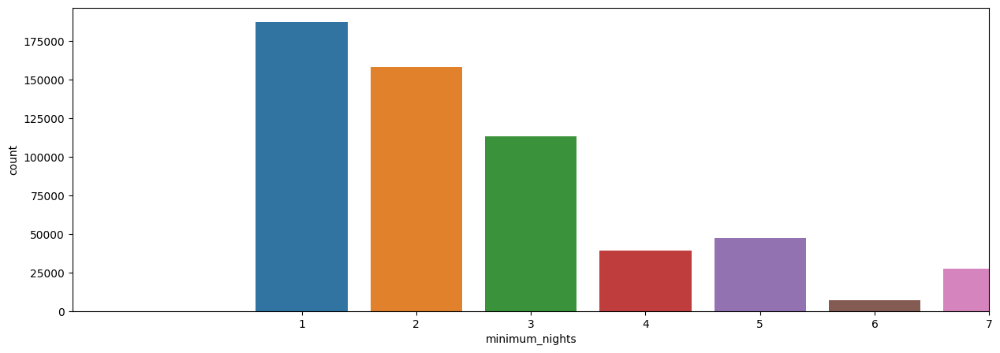

In [42]:
grafico_barra(base_airbnb['minimum_nights'])

### Analisando 'maximum_nights'

- Neste caso o número máximo de noites está com alguns valores estranhos que não fazem muito sentido e muitos valores 0, ou seja, na maioria dos casos esse valor provavelmente nem foi preenchido, portanto vamos excluir esta 'feature' da análise.

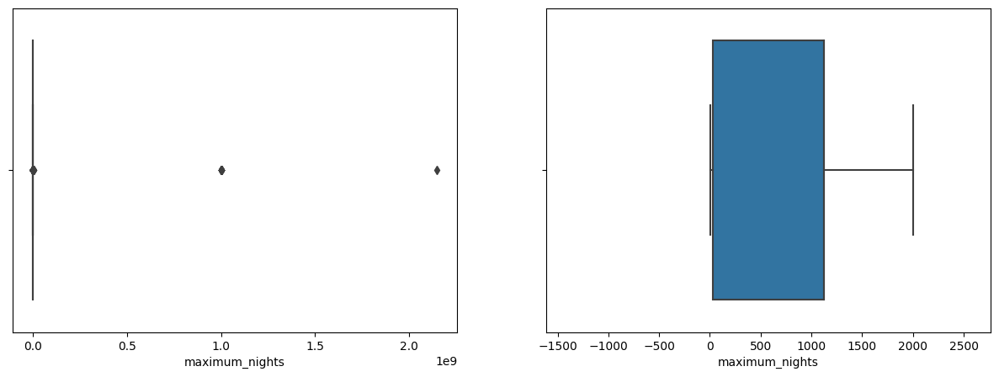

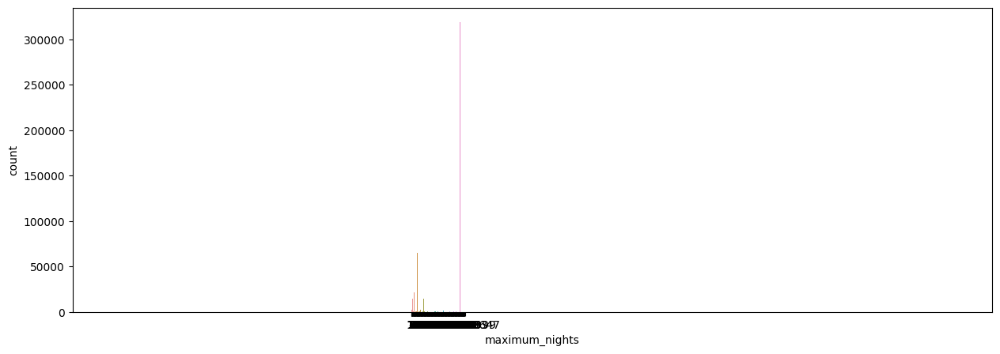

In [43]:
diagrama_caixa(base_airbnb['maximum_nights'])
grafico_barra(base_airbnb['maximum_nights'])

In [44]:
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 21)

### Analisando 'number_of_reviews'

- Neste caso quanto mais 'reviews' provavelmente mais bem consolidado o preço daquele imóvel está, neste caso não faria muito sentido excluir esses outliers

- Por outro lado, como o objetivo é criar um modelo que atenda uma pessoa comum que quer alugar seu imóvel, ela provavelmente não terá nenhuma 'review' e portanto essa 'feature' não pode ser um fator determinante do preço do imóvel, então vamos excluir esta 'feature'

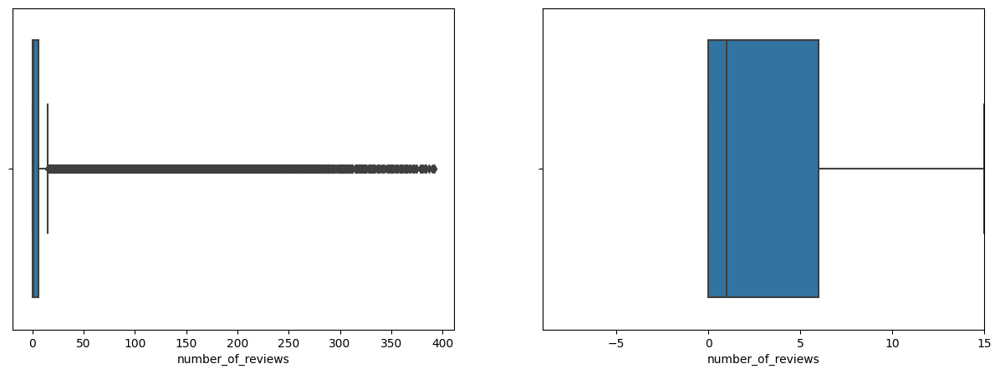

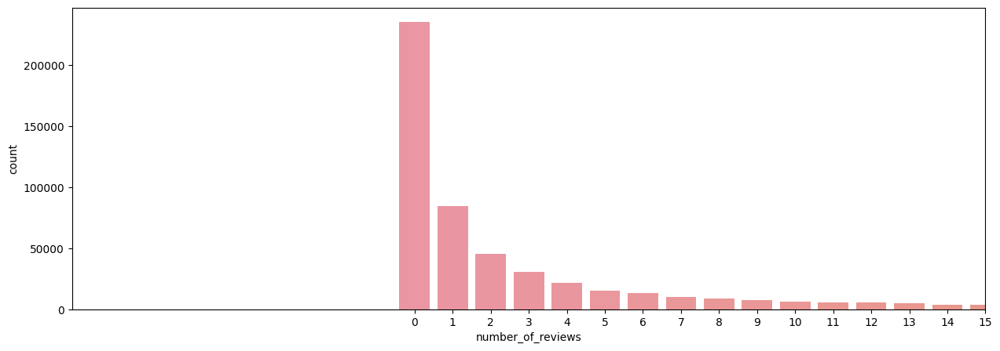

In [45]:
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])

In [46]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 20)

## Tratamento das 'features' com Valores de Texto

### Analisando 'property_type'

- Aqui vamos agrupar as categorias que estão muito 'pulverizados' na categoria 'Outros'

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

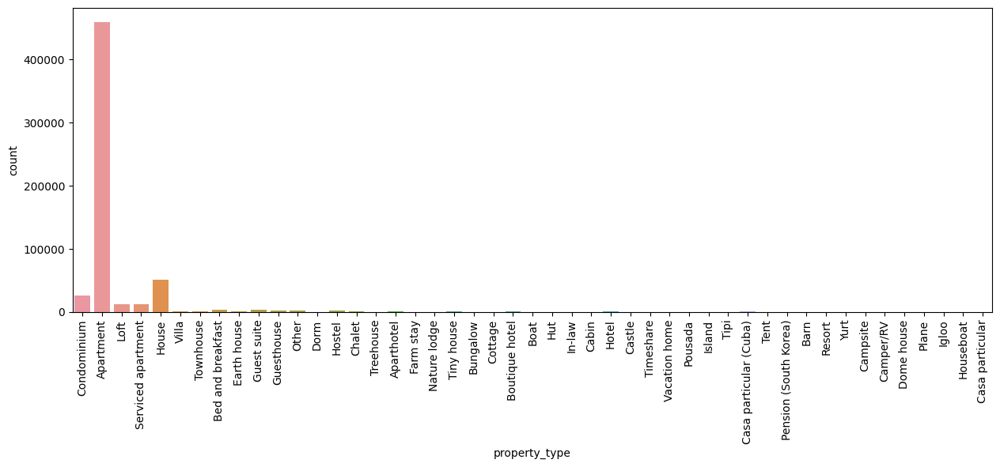

In [47]:
print(base_airbnb['property_type'].value_counts())

grafico_contagem(base_airbnb['property_type'], base_airbnb)

['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)', 'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Timeshare', 'Pousada', 'Houseboat', 'Casa particular', 'Plane']
property_type
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: count, dtype: int64


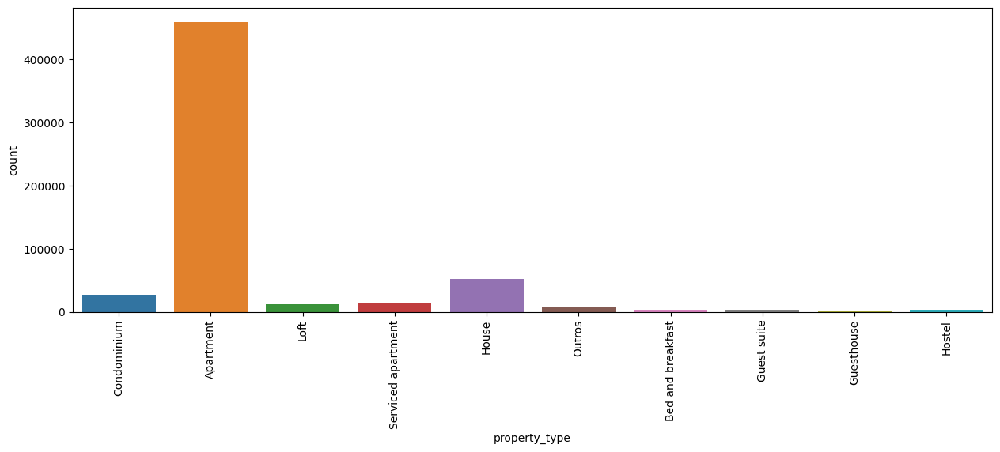

In [48]:
tabela_tipos_propriedade = base_airbnb['property_type'].value_counts()
colunas_agrupar = []

#listando quais colunas quero agrupar
for tipo in tabela_tipos_propriedade.index:
    if tabela_tipos_propriedade[tipo] < 2000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

#agrupando os tipos de propriedades na base original
for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['property_type']==tipo, 'property_type'] = 'Outros'
    
print(base_airbnb['property_type'].value_counts())

grafico_contagem(base_airbnb['property_type'], base_airbnb)

### Analisando 'room_type'

- Não será necessária alterar esta 'feature'

room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64


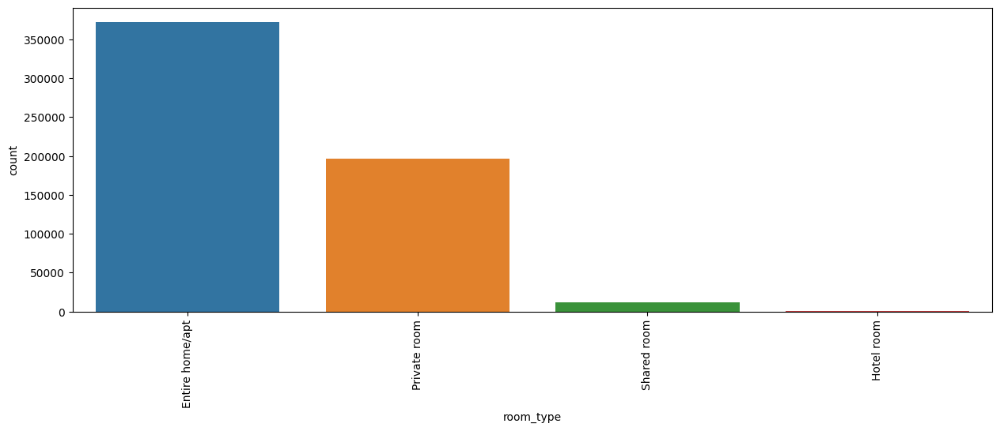

In [49]:
print(base_airbnb['room_type'].value_counts())
grafico_contagem(base_airbnb['room_type'], base_airbnb)

### Analisando 'bed_type'

- Aqui vamos agrupar todos os tipos que não sejam 'Real Bed' em uma única categoria

bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64


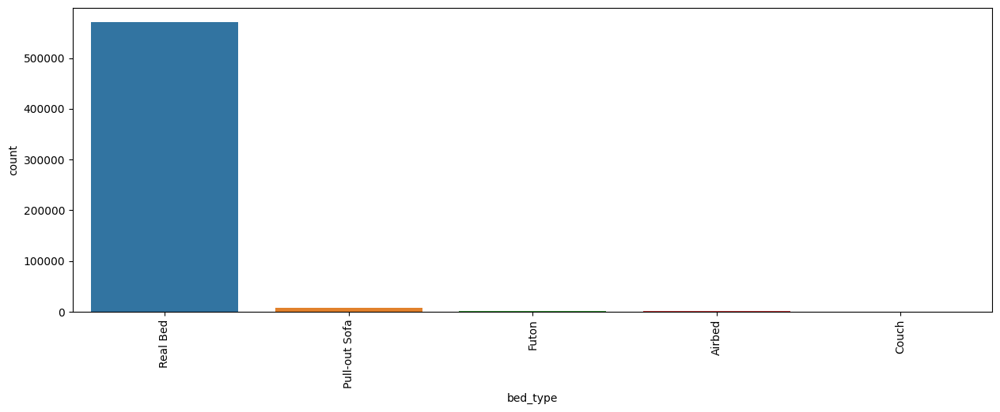

In [50]:
print(base_airbnb['bed_type'].value_counts())
grafico_contagem(base_airbnb['bed_type'], base_airbnb)

['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
bed_type
Real Bed    570643
Outros       11340
Name: count, dtype: int64


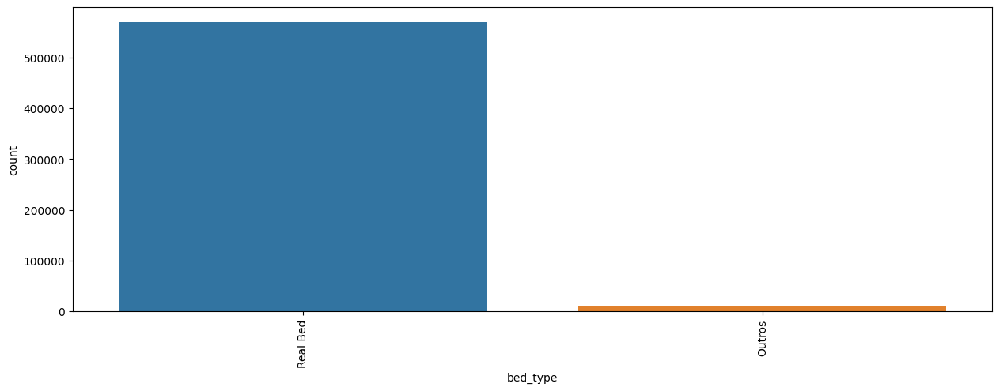

In [51]:
tabela_bed = base_airbnb['bed_type'].value_counts()
colunas_agrupar = []

#listando quais colunas quero agrupar
for tipo in tabela_bed.index:
    if tabela_bed[tipo] < 9000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

#agrupando os tipos de propriedades na base original
for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['bed_type']==tipo, 'bed_type'] = 'Outros'
    
print(base_airbnb['bed_type'].value_counts())

grafico_contagem(base_airbnb['bed_type'], base_airbnb)

### Analisando 'cancellation_policy'

- Aqui vamos agrupar 'strict', 'super_strict_60' e 'super_strict_30'

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64


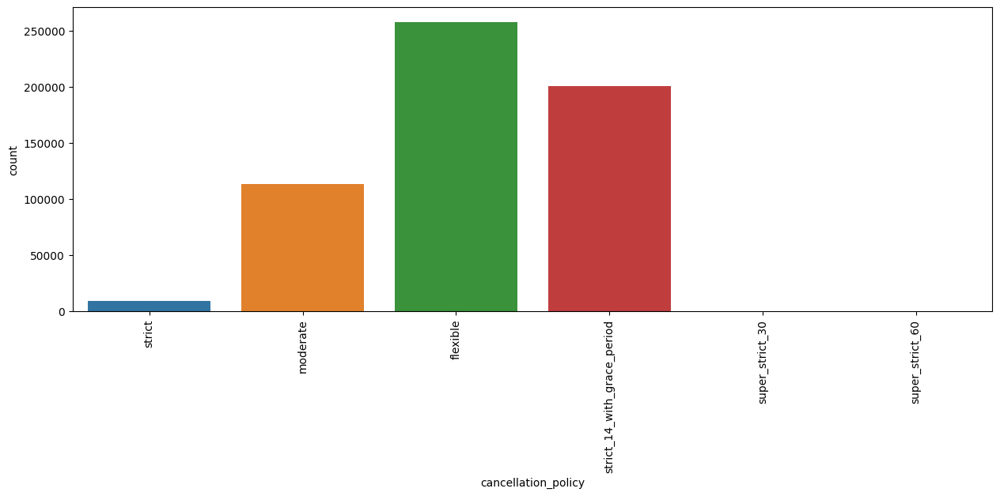

In [52]:
print(base_airbnb['cancellation_policy'].value_counts())
grafico_contagem(base_airbnb['cancellation_policy'], base_airbnb)

['strict', 'super_strict_60', 'super_strict_30']
cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: count, dtype: int64


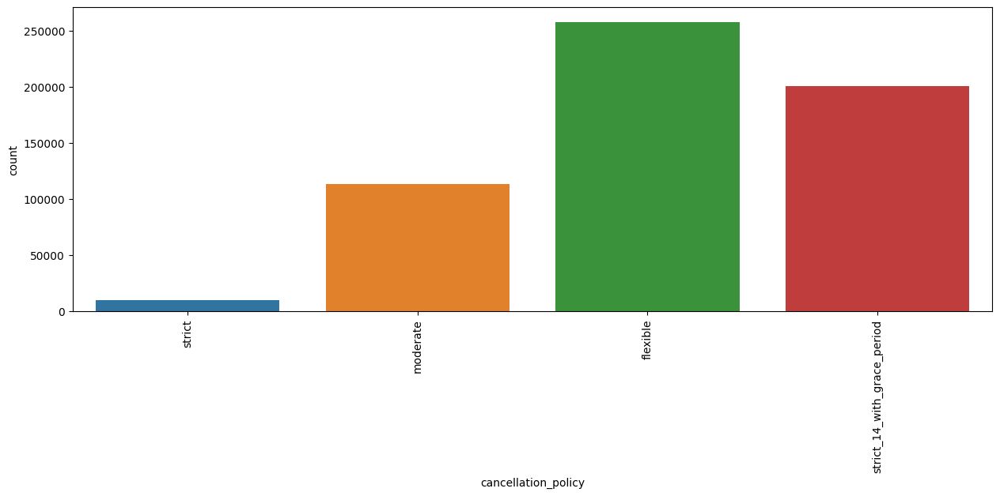

In [53]:
tabela_cancellation = base_airbnb['cancellation_policy'].value_counts()
colunas_agrupar = []

#listando quais colunas quero agrupar
for tipo in tabela_cancellation.index:
    if tabela_cancellation[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

#agrupando os tipos de propriedades na base original
for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo, 'cancellation_policy'] = 'strict'
    
print(base_airbnb['cancellation_policy'].value_counts())

grafico_contagem(base_airbnb['cancellation_policy'], base_airbnb)

### Analisando 'amenities'

- Neste caso vamos usar como parâmetro de avaliação a quantidade de 'amenities' que aquele imóvel possui e não quais tipos específicos de 'amenities' existem nele, razão principal disso é por conta dos itens descritos diferirem muito de anúncio para anúncio (ex: um item pode ser descrito de formas diferentes em anúncios diferentes).

In [54]:
print(base_airbnb['amenities'].iloc[0].split(','))
print(len(base_airbnb['amenities'].iloc[0].split(',')))

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Front desk/doorperson"', '"Private entrance"', '"Hot water"', '"Bed linens"', '"Luggage dropoff allowed"}']
25


In [55]:
#criando uma nova coluna
base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len)
base_airbnb.shape

(581983, 21)

In [56]:
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 20)

- Tratando o 'n_amenities'

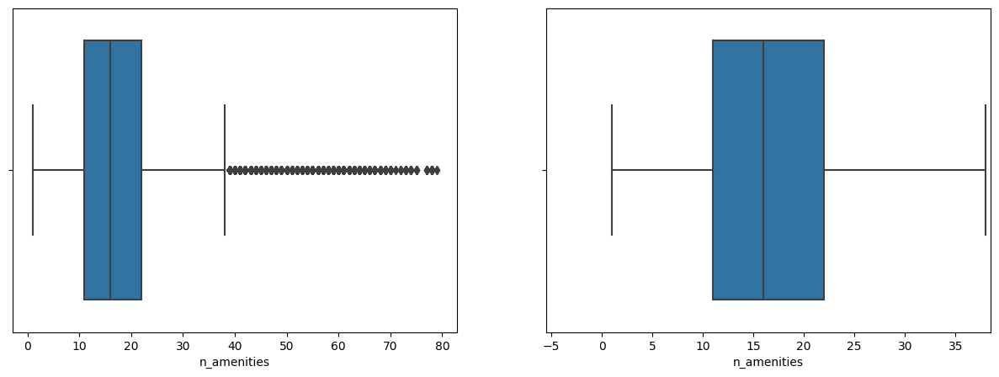

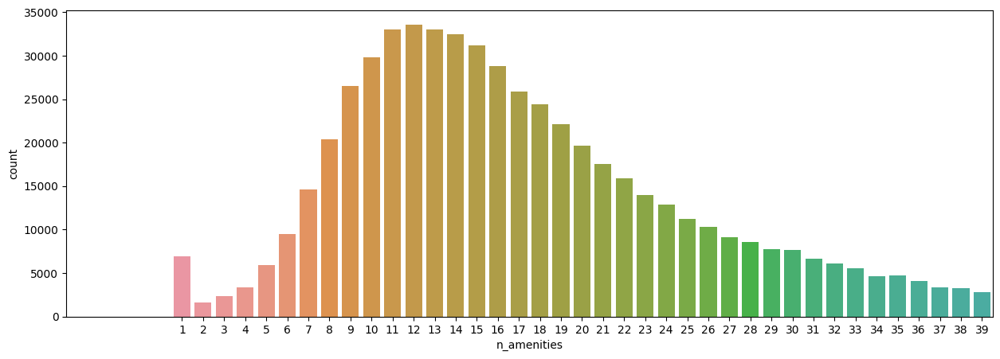

In [57]:
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

In [58]:
base_airbnb, linhas_removidas = excluir_outlier(base_airbnb, 'n_amenities')
print(f'{linhas_removidas} linhas removidas.')

24343 linhas removidas.


(557640, 20)


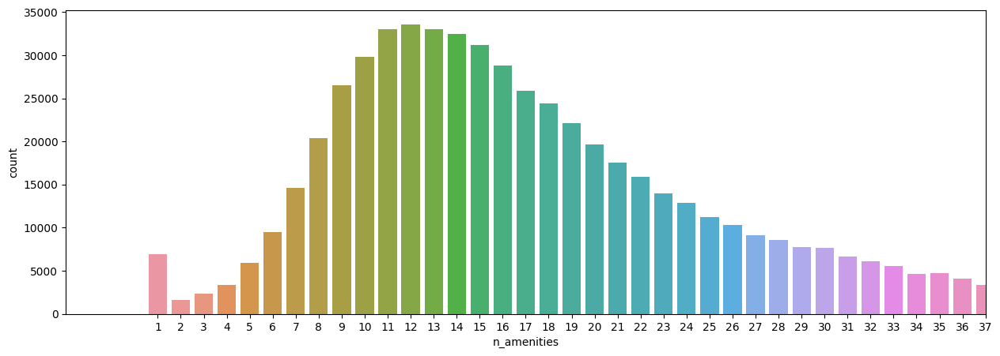

In [59]:
#agora com os outliers removidos
grafico_barra(base_airbnb['n_amenities'])
print(base_airbnb.shape)

### Visualização de Mapa das Propriedades

In [60]:
df_amostra = base_airbnb.sample(n=100000)
centro_mapa = {'lat':df_amostra.latitude.mean(), 'lon':df_amostra.longitude.mean()}

mapa = px.density_mapbox(df_amostra, lat='latitude', lon='longitude', z='price', radius=2.5,
                         center=centro_mapa, zoom=10, mapbox_style='stamen-terrain')
mapa.show()

### Encoding

Precisamos ajustar as features para facilitar o trabalho do modelo futuro (features de categoria, true e false, etc.)
- Features Booleanas (True ou False), vamos substituir True por 1 e False por 0
- Features de Categoria (possuem valores de texto) vamos utilizar o método encoding de variáveis dummies

In [61]:
features_TF = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']
base_airbnb_encod = base_airbnb.copy()

print(base_airbnb_encod.iloc[0])
print('-'*60)

for coluna in features_TF:
    base_airbnb_encod.loc[base_airbnb_encod[coluna]=='t', coluna] = 1
    base_airbnb_encod.loc[base_airbnb_encod[coluna]=='f', coluna] = 0
    
print(base_airbnb_encod.iloc[0])

host_is_superhost                         t
host_listings_count                     2.0
latitude                         -22.965919
longitude                        -43.178962
property_type                   Condominium
room_type                   Entire home/apt
accommodates                              5
bathrooms                               1.0
bedrooms                                2.0
beds                                    2.0
bed_type                           Real Bed
price                                 270.0
extra_people                           51.0
minimum_nights                            4
instant_bookable                          t
is_business_travel_ready                  f
cancellation_policy                  strict
ano                                    2018
mês                                       4
n_amenities                              25
Name: 1, dtype: object
------------------------------------------------------------
host_is_superhost                   

In [62]:
features_categoria = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']

base_airbnb_encod = pd.get_dummies(data=base_airbnb_encod, columns=features_categoria, dtype=int)
display(base_airbnb_encod.head())

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,1,0,0,0,0,1,0,0,1,0
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,1,0,0,0,0,1,0,0,1,0
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,1,0,0,0,0,1,0,0,1,0
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,1,0,0,0,0,1,0,0,1,0
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,1,0,0,0,0,1,0,0,1,0


### Modelo de Previsão

- Métricas de Avaliação

In [63]:
def avaliar_modelo(nome_modelo, y_teste, previsao):
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_teste, previsao))
    return f'Modelo {nome_modelo}: \nR²:{r2:.2%} \nRSME:{RSME:.2f}'

- Escolha dos Modelos a serem testados
    1) RandomForest
    2) LinearRegression
    3) ExtraTrees

In [64]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'RandomForest': modelo_rf,
           'LinearRegression': modelo_lr,
           'ExtraTrees': modelo_et,}

y = base_airbnb_encod['price']
x = base_airbnb_encod.drop('price', axis=1)

- Separação Dados de Treino e Dados de Teste + Treino do Modelo

In [65]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=10)

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(x_train, y_train)
    #testar
    previsao = modelo.predict(x_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest: 
R²:97.25% 
RSME:43.98
Modelo LinearRegression: 
R²:32.70% 
RSME:217.54
Modelo ExtraTrees: 
R²:97.52% 
RSME:41.79


### Análise do Melhor Modelo

In [66]:
#realizando a previsão com os modelos já treinado
for nome_modelo, modelo in modelos.items():
    #testar
    previsao = modelo.predict(x_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest: 
R²:97.25% 
RSME:43.98
Modelo LinearRegression: 
R²:32.70% 
RSME:217.54
Modelo ExtraTrees: 
R²:97.52% 
RSME:41.79


- Modelo Escolhido como Melhor Modelo: ExtraTreesRegressor

    Esse foi o modelo com maior valor de R² e ao mesmo tempo o menor valor de RSME. Como não tivemos uma grande diferença de velocidade de treino e de previsão desse modelo com o modelo de RandomForest (o qual teve resultados próximos de R² e RSME) vamos escolher o Modelo ExtraTrees.
    
    O Modelo LinearRegression não obteve um resultado satisfatório com valores de R² e RSME bem inferiores do que os outros modelos.
    <br>
- Resultados da Métricas de Avaliação do Modelo Vencedor:<br>
Modelo ExtraTrees:<br>
R²:97.52% <br>
RSME:41.79

### Ajustes e Melhorias no Melhor Modelo

In [68]:
print(x_train.columns)
print(modelo_et.feature_importances_)

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'extra_people',
       'minimum_nights', 'instant_bookable', 'is_business_travel_ready', 'ano',
       'mês', 'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room', 'bed_type_Outros',
       'bed_type_Real Bed', 'cancellation_policy_flexible',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object')
[0.01305664 0.03982369 0.10404371 0.10130492 0.07823004 0.07078764
 0.1047499  0.05252093 0

In [70]:
importancia_features = pd.DataFrame(modelo_et.feature_importances_, x_train.columns)
importancia_features = importancia_features.sort_values(by=0, ascending=False)
display(importancia_features)

,0
bedrooms,0.104750
latitude,0.104044
longitude,0.101305
n_amenities,0.089093
extra_people,0.087630
accommodates,0.078230
bathrooms,0.070788
room_type_Entire home/apt,0.068640
minimum_nights,0.064963
beds,0.052521


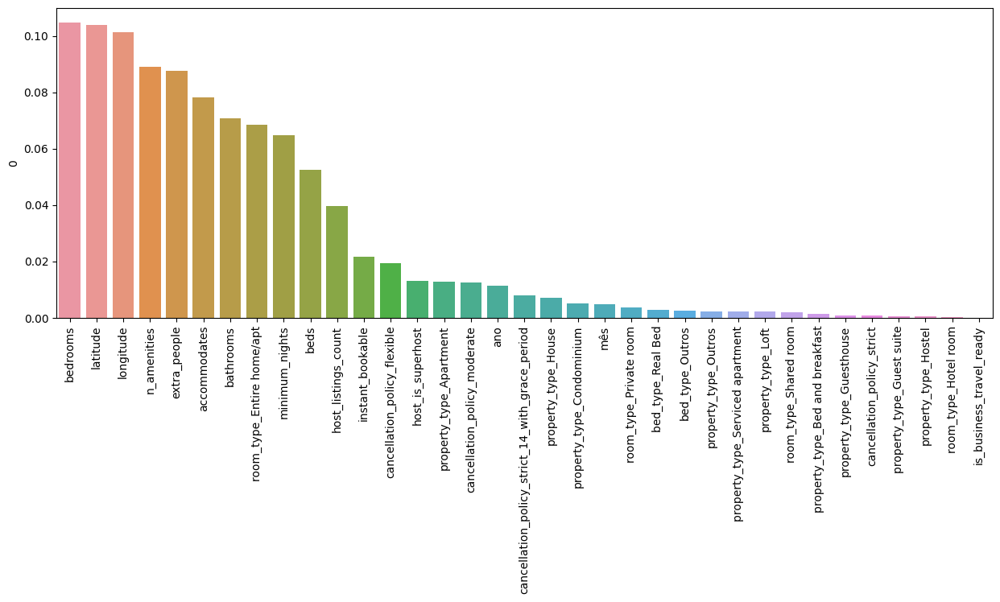

In [78]:
plt.figure(figsize=(15, 5))
grafico = sns.barplot(x=importancia_features.index, y=importancia_features[0])
grafico.tick_params(axis='x', rotation = 90)

#### Vamos discutir sobre as 10 melhores features e o porque do modelo ter escolhido essas features como melhores

 - Longitude e latitude eram de se esperar que teriam grande impacto no preço pois a localização (principalmente no Rio de Janeiro) é um grande diferencial na procura por imóveis
 - A quantidade de quarto impacta diretamente na quantidade de hospedes então faz sentido possuir grande importância
 - Número de comodidades pode ser um indicativo de que o hóspede do imóvel é mais detalhista e está pontuando vários aspectos positivos daquele imóvel
 - A quantidade de pessoas que serão hospedadas e a cobrança por pessoas extras também está diretamente relacionado a capacidade da estrutura daquele imóvel e portanto deve impactar no preço final
 - A quantidade de banheiros deve estar relacionado a comodidade dos clientes e quantidade de clientes também e pode ser um fator decisivo na escolha, por isso teve um valor de impacto alto
 - O tipo de quarto, assim como a quantidade de banheiros, está relacionado a comodidade dos clientes e por isso deve ter grande influência na decisão deles
 - A quantidade mínima de noites afeta o valor mínimo que o cliente deve pagar, por isso deve ser um fator decisivo ao cliente
 - O número de camas é fator decisivo pois está diretamente relacionado a quantidade de clientes que irão se hospedar

#### Em essência vamos preferir modelos que necessitem de menos features, então é interessante remover a maior quantidade de features possíveis desde que isso não cause grande impacto na performance do modelo

### Ajustes Finais no Modelo
- is_business_travel_ready não parece ter muito impacto no nosso modelo. Por isso, para chegar em um modelo mais simples vamos excluir esta feature, treinar o modelo novamente e testar o modelo sem ela

In [80]:
base_airbnb_encod = base_airbnb_encod.drop('is_business_travel_ready', axis=1)

y = base_airbnb_encod['price']
x = base_airbnb_encod.drop('price', axis=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=10)

#treinando novamente
modelo_et.fit(x_train, y_train)
#testando
previsao = modelo_et.predict(x_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees: 
R²:97.51% 
RSME:41.87


O modelo quase não apresentou mudança nas suas métricas, então vamos manter a retirada da feature 'is_business_travel_ready'

- testando 'bed_type'

In [81]:
base_teste = base_airbnb_encod.copy()

for coluna in base_teste:
    if 'bed_type' in coluna:
        base_teste = base_teste.drop(coluna, axis=1)
print(base_teste.columns)
y = base_teste['price']
x = base_teste.drop('price', axis=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=10)

#treinando novamente
modelo_et.fit(x_train, y_train)
#testando
previsao = modelo_et.predict(x_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'extra_people', 'minimum_nights', 'instant_bookable', 'ano', 'mês',
       'n_amenities', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Outros', 'property_type_Serviced apartment',
       'room_type_Entire home/apt', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room',
       'cancellation_policy_flexible', 'cancellation_policy_moderate',
       'cancellation_policy_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object')
Modelo ExtraTrees: 
R²:97.51% 
RSME:41.88


O modelo quase não apresentou mudança nas suas métricas, então vamos manter a retirada da feature 'bed_type'

In [82]:
print(previsao)

[100.37 998.5  249.15 ... 124.41 276.88 119.83]


# Deploy do Projeto

- Passo 1 -> Criar arquivo do Modelo (joblib)<br>
- Passo 2 -> Escolher a forma de deploy:
    - Arquivo Executável + Tkinter
    - Deploy em Microsite (Flask)
    - Deploy apenas para uso direto Streamlit
- Passo 3 -> Outro arquivo Python (pode ser Jupyter ou PyCharm)
- Passo 4 -> Importar streamlit e criar código
- Passo 5 -> Atribuir ao botão o carregamento do modelo
- Passo 6 -> Deploy feito

In [83]:
#Salvando a base de dados já tratada
x['price'] = y
x.to_csv('dados.csv')

In [84]:
#transformando o modelo em um arquivo
import joblib
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']